In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import os
from re import search
import shutil
import natsort
from PIL import Image
import matplotlib.pyplot as plt
import cv2
from os import listdir
import matplotlib as plt
from matplotlib.image import *
from sklearn.model_selection import train_test_split
import keras
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense,Flatten,Dropout
from keras.layers.normalization import batch_normalization
from matplotlib.image import imread
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from keras.utils import to_categorical
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

In [ ]:
##read train file##
train=pd.read_csv(r"/content/drive/MyDrive/train.csv")

In [ ]:
##prepering data##
class_names=train.loc[:,'healthy':].columns
print(class_names)
number=0
train['label']=0
for i in class_names:
    train['label']=train['label'] + train[i] * number
    number=number+1
train.head()   

Index(['healthy', 'multiple_diseases', 'rust', 'scab'], dtype='object')


,image_id,healthy,multiple_diseases,rust,scab,label
0,Train_0,0,0,0,1,3
1,Train_1,0,1,0,0,1
2,Train_2,1,0,0,0,0
3,Train_3,0,0,1,0,2
4,Train_4,1,0,0,0,0


In [ ]:
train=pd.read_csv(r"/content/drive/MyDrive/train.csv")
class_names=train.loc[:,'healthy':].columns
print(class_names)
number=0
train['label']=0
for i in class_names:
    train['label']=train['label'] + train[i] * number
    number=number+1
train.head() 
categories=train.iloc[:1007,5].values  
print(categories.shape)

Index(['healthy', 'multiple_diseases', 'rust', 'scab'], dtype='object')
(1007,)


In [ ]:
def load_images_and_labels():
    img_lst=[]
    labels=[]
    j=0
    for index in os.listdir('/content/drive/MyDrive/images_Train'):  
        img=cv2.imread(os.path.join('/content/drive/MyDrive/images_Train',index))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_array = Image.fromarray(img, 'RGB') 
        #resize image to 128*128 
        resized_img = img_array.resize((128,128))
        img_lst.append(np.array(resized_img))
        labels.append(index)
        j+=1
        if j==1007:
           return img_lst, labels
images, labels = load_images_and_labels()
print("No. of images loaded = ",len(images),"\nNo. of labels loaded = ",len(labels))
print(type(images),type(labels))


No. of images loaded =  1007 
No. of labels loaded =  1007
<class 'list'> <class 'list'>


In [ ]:
images =np.array(images)
labels =np.array(labels)
print("Images shape = ",images.shape,"\nLabels shape = ",labels.shape)
print(type(images),type(labels))
####first num for num of images ...and second,third num for size of each img...fourth num for dimention



Images shape =  (1007, 128, 128, 3) 
Labels shape =  (1007,)
<class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [ ]:
#######spliting data########
X_train=images
Y_train=categories
x_train, x_val, y_train, y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state=42)
from keras.utils import to_categorical
y_val = to_categorical(y_val, 4)
y_train = to_categorical(y_train, 4)
print(X_train.shape, x_train.shape, x_val.shape)

(1007, 128, 128, 3) (805, 128, 128, 3) (202, 128, 128, 3)


In [ ]:
#####scale of each feature###
X_train_scaled = x_train/255
X_test_scaled = x_val/255
print(X_train_scaled.shape)
print(X_test_scaled.shape)
# print(X_train_scaled)
# print(y_train)

(805, 128, 128, 3)
(202, 128, 128, 3)


In [ ]:
##############Build Neural network#############
ann = tf.keras.Sequential()
##input##
ann.add(tf.keras.layers.Flatten(input_shape=(128,128,3)))
##hidden1##
ann.add(tf.keras.layers.Dense(units=182, activation='relu'))
##hidden2##
ann.add(tf.keras.layers.Dense(units=182, activation='relu'))
##hidden3##
ann.add(tf.keras.layers.Dense(units=182, activation='relu'))
##hidden4##
ann.add(tf.keras.layers.Dense(units=182, activation='relu'))
# ##hidden5##
# ann.add(tf.keras.layers.Dense(units=100, activation='relu'))
# ##hidden6##
# ann.add(tf.keras.layers.Dense(units=100, activation='relu'))
##output##
ann.add(tf.keras.layers.Dense(units=4, activation='softmax'))
ann.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 49152)             0         
                                                                 
 dense (Dense)               (None, 182)               8945846   
                                                                 
 dense_1 (Dense)             (None, 182)               33306     
                                                                 
 dense_2 (Dense)             (None, 182)               33306     
                                                                 
 dense_3 (Dense)             (None, 182)               33306     
                                                                 
 dense_4 (Dense)             (None, 4)                 732       
                                                                 
Total params: 9,046,496
Trainable params: 9,046,496
Non-

In [ ]:
##################compiler model#####
ann.compile(optimizer = 'adam', loss = 'categorical_crossentropy',metrics = ['accuracy'])

In [18]:

checkpoint = keras.callbacks.ModelCheckpoint(filepath="weight.h5",verbose=1,save_best_only=True)
history=ann.fit (X_train_scaled, y_train , epochs= 30,validation_data=(X_test_scaled,y_val),batch_size=57,callbacks=[checkpoint], verbose=1 )


Epoch 1/30
15/15 [==============================] - ETA: 0s - loss: 1.2335 - accuracy: 0.6062
Epoch 1: val_loss improved from inf to 1.52818, saving model to weight.h5
15/15 [==============================] - 4s 255ms/step - loss: 1.2335 - accuracy: 0.6062 - val_loss: 1.5282 - val_accuracy: 0.2970
Epoch 2/30
15/15 [==============================] - ETA: 0s - loss: 0.8898 - accuracy: 0.6422
Epoch 2: val_loss did not improve from 1.52818
15/15 [==============================] - 3s 165ms/step - loss: 0.8898 - accuracy: 0.6422 - val_loss: 2.1081 - val_accuracy: 0.3317
Epoch 3/30
15/15 [==============================] - ETA: 0s - loss: 0.8165 - accuracy: 0.7031
Epoch 3: val_loss improved from 1.52818 to 1.46883, saving model to weight.h5
15/15 [==============================] - 2s 126ms/step - loss: 0.8165 - accuracy: 0.7031 - val_loss: 1.4688 - val_accuracy: 0.3663
Epoch 4/30
15/15 [==============================] - ETA: 0s - loss: 0.9348 - accuracy: 0.5950
Epoch 4: val_loss did not improv

In [ ]:
print(type(X_train_scaled))
print(type(y_train))
print(type(x_val))
print(type(y_val))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


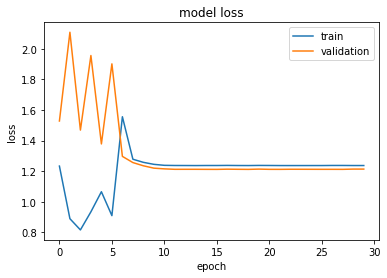

In [19]:
import matplotlib.pyplot as plt
print(history.history.keys())
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','validation'],loc='upper right')
plt.show()


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


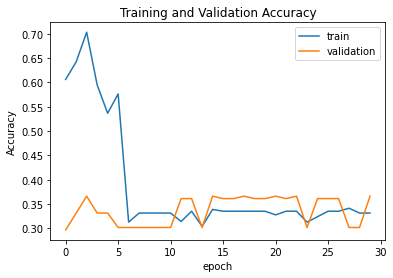

In [20]:
print(history.history.keys())
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Training and Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('epoch')
plt.legend(['train','validation'],loc='upper right')
plt.show()

In [21]:
# ######evaluate##check validation##
score, acc = ann.evaluate(X_test_scaled, y_val)
print('Test Loss =', score)
print('Test Accuracy =', acc*100)
print(ann.metrics_names)

7/7 [==============================] - 0s 18ms/step - loss: 1.2139 - accuracy: 0.3663
Test Loss = 1.2139440774917603
Test Accuracy = 36.63366436958313
['loss', 'accuracy']


In [22]:
###########read image of testing########
def load_images_and_labels():
    img_lst=[]
    labels=[]
    for index in os.listdir('/content/drive/MyDrive/imagesafter1007'):  
        img=cv2.imread(os.path.join('/content/drive/MyDrive/imagesafter1007',index))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_array = Image.fromarray(img, 'RGB') 
        #resize image to 128*128 
        resized_img = img_array.resize((128,128))
        img_lst.append(np.array(resized_img))
        labels.append(index)
    return img_lst, labels
images, labels = load_images_and_labels()
print("No. of images loaded = ",len(images),"\nNo. of labels loaded = ",len(labels))
print(type(images),type(labels))
images_of_test=np.array(images)
label_of_test=train.iloc[1007:,5].values  
label_of_test=np.array(label_of_test)

No. of images loaded =  813 
No. of labels loaded =  813
<class 'list'> <class 'list'>


1/1 [==============================] - 0s 25ms/step
2


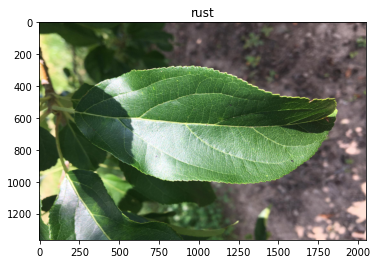

1/1 [==============================] - 0s 25ms/step
2


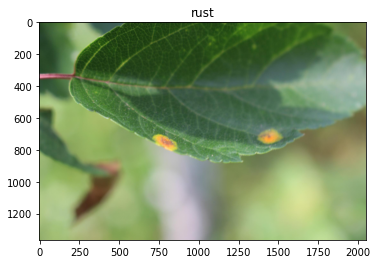

1/1 [==============================] - 0s 23ms/step
2


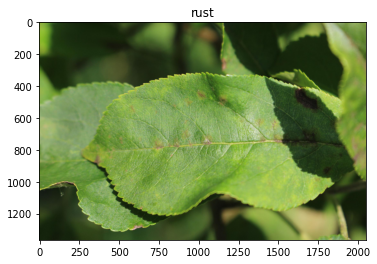

1/1 [==============================] - 0s 24ms/step
2


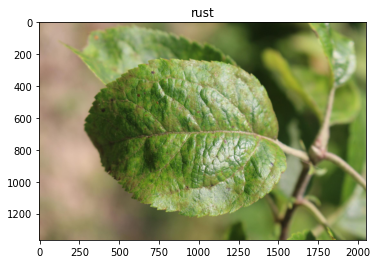

1/1 [==============================] - 0s 23ms/step
2


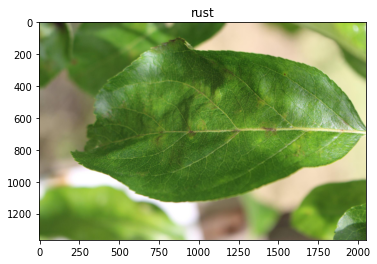

1/1 [==============================] - 0s 29ms/step
2


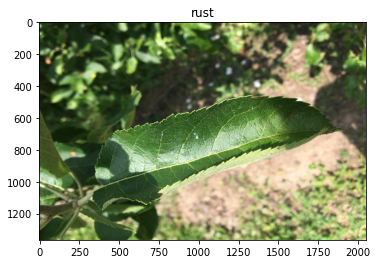

1/1 [==============================] - 0s 26ms/step
2


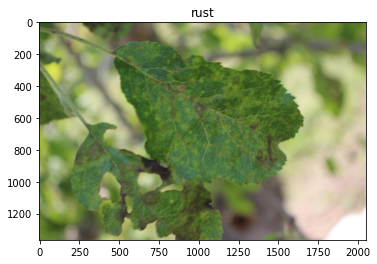

1/1 [==============================] - 0s 24ms/step
2


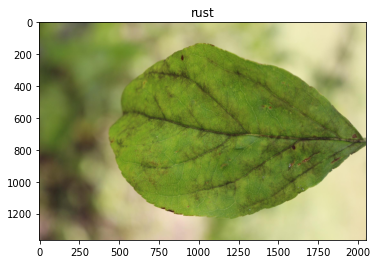

1/1 [==============================] - 0s 66ms/step
2


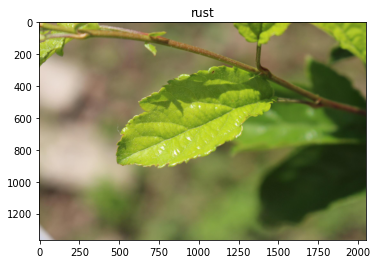

1/1 [==============================] - 0s 28ms/step
2


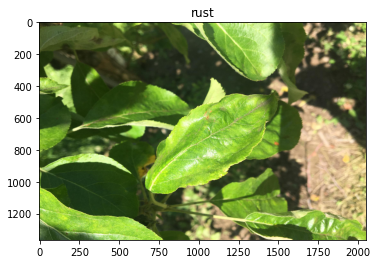

1/1 [==============================] - 0s 25ms/step
2


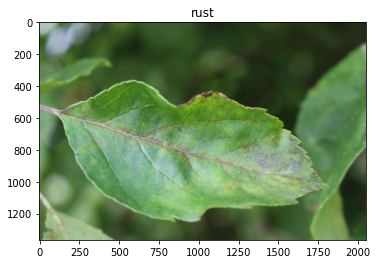

1/1 [==============================] - 0s 22ms/step
2


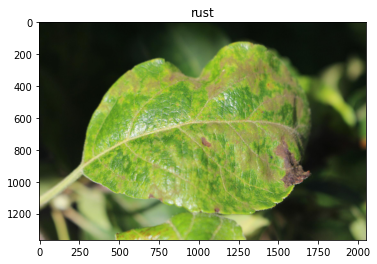

1/1 [==============================] - 0s 22ms/step
2


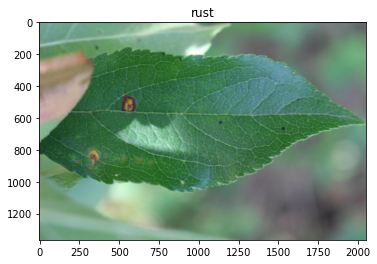

1/1 [==============================] - 0s 23ms/step
2


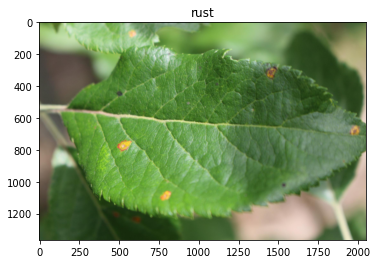

1/1 [==============================] - 0s 26ms/step
2


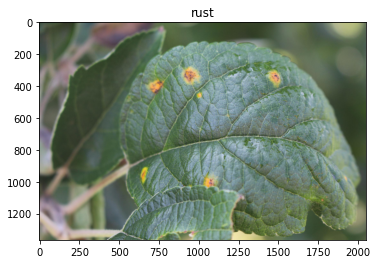

1/1 [==============================] - 0s 24ms/step
2


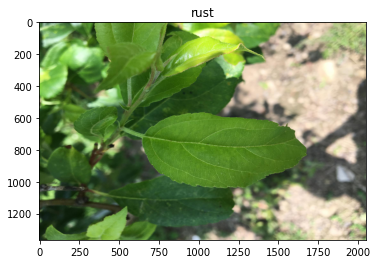

1/1 [==============================] - 0s 30ms/step
2


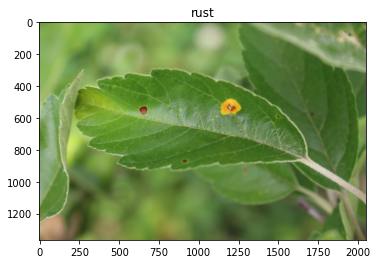

1/1 [==============================] - 0s 42ms/step
2


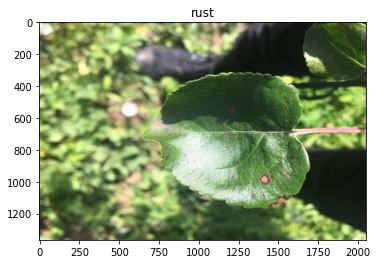

1/1 [==============================] - 0s 26ms/step
2


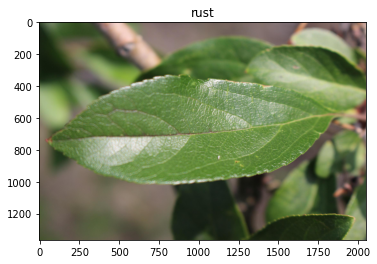

1/1 [==============================] - 0s 90ms/step
2


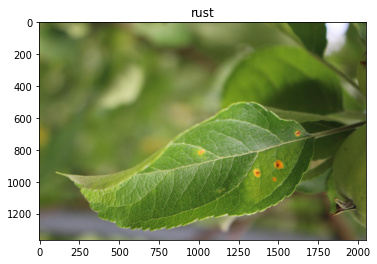

1/1 [==============================] - 0s 40ms/step
2


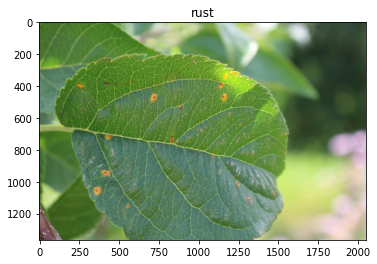

1/1 [==============================] - 0s 39ms/step
2


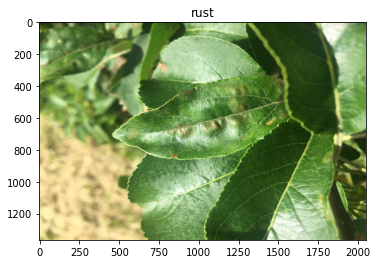

1/1 [==============================] - 0s 128ms/step
2


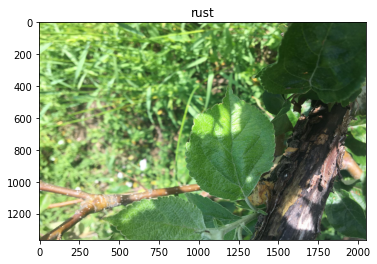

1/1 [==============================] - 0s 35ms/step
2


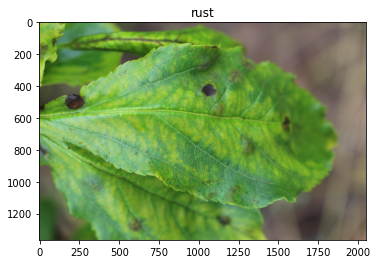

1/1 [==============================] - 0s 55ms/step
2


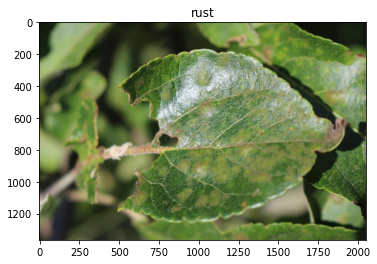

1/1 [==============================] - 0s 66ms/step
2


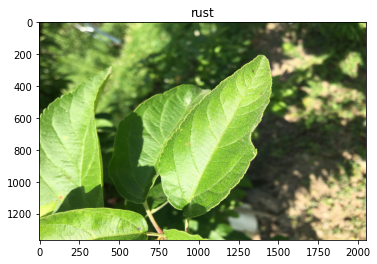

1/1 [==============================] - 0s 54ms/step
2


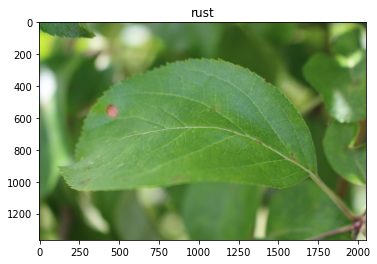

1/1 [==============================] - 0s 37ms/step
2


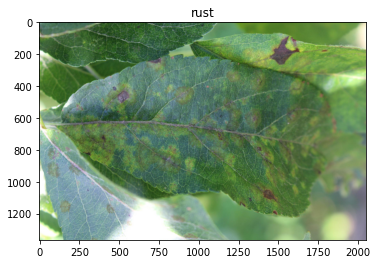

1/1 [==============================] - 0s 30ms/step
2


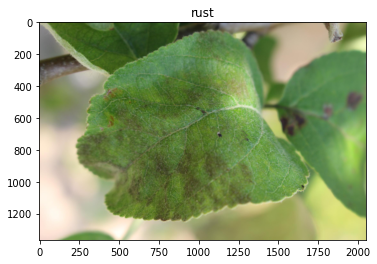

1/1 [==============================] - 0s 26ms/step
2


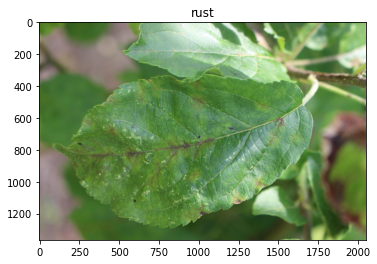

1/1 [==============================] - 0s 30ms/step
2


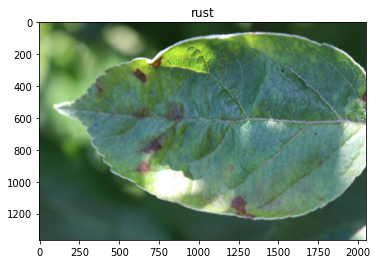

1/1 [==============================] - 0s 24ms/step
2


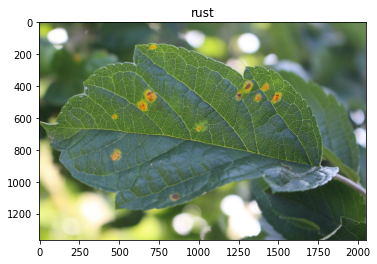

1/1 [==============================] - 0s 38ms/step
2


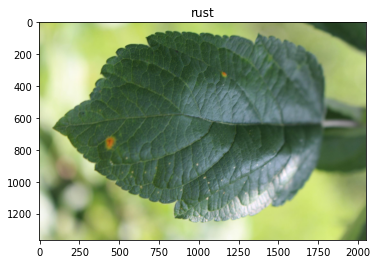

1/1 [==============================] - 0s 24ms/step
2


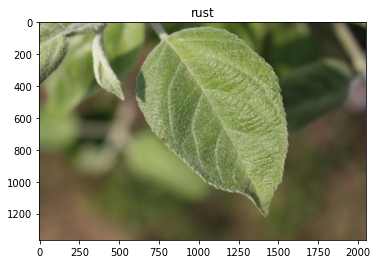

1/1 [==============================] - 0s 23ms/step
2


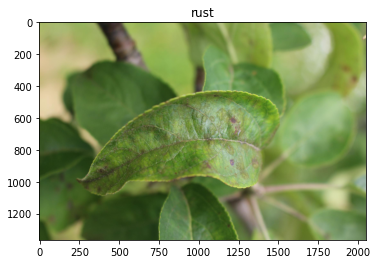

1/1 [==============================] - 0s 24ms/step
2


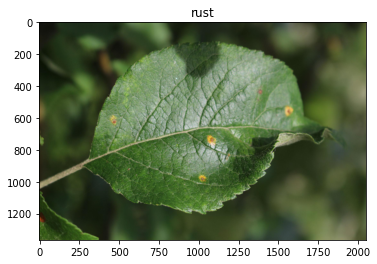

1/1 [==============================] - 0s 35ms/step
2


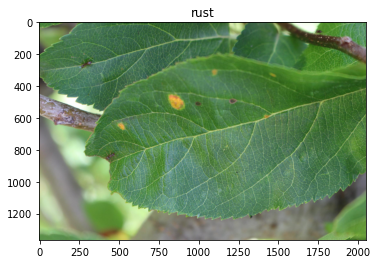

1/1 [==============================] - 0s 23ms/step
2


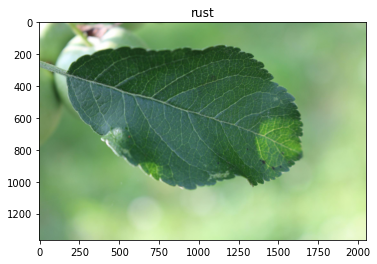

1/1 [==============================] - 0s 24ms/step
2


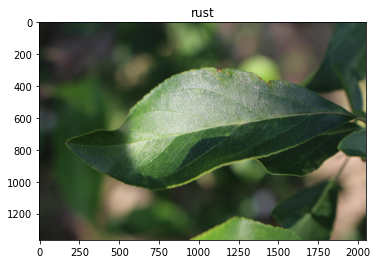

1/1 [==============================] - 0s 26ms/step
2


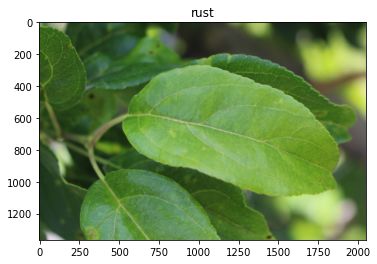

1/1 [==============================] - 0s 23ms/step
2


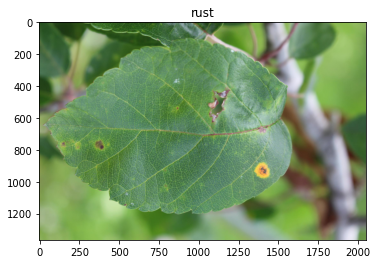

1/1 [==============================] - 0s 25ms/step
2


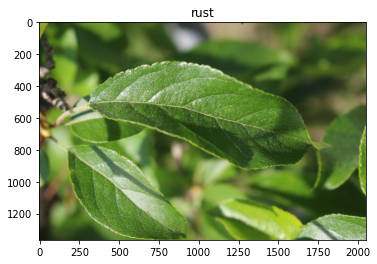

1/1 [==============================] - 0s 26ms/step
2


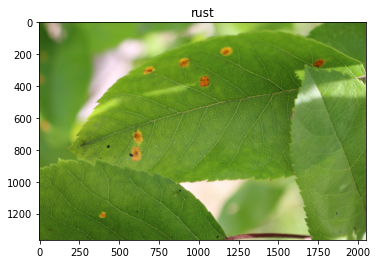

1/1 [==============================] - 0s 28ms/step
2


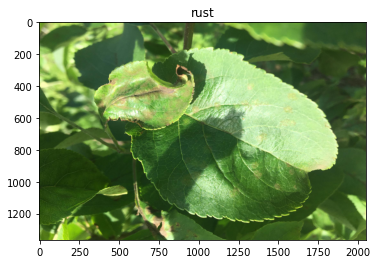

1/1 [==============================] - 0s 37ms/step
2


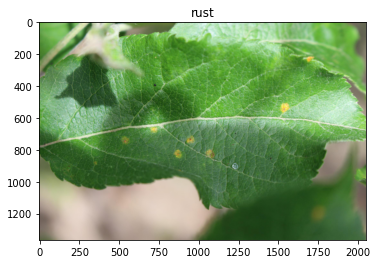

1/1 [==============================] - 0s 32ms/step
2


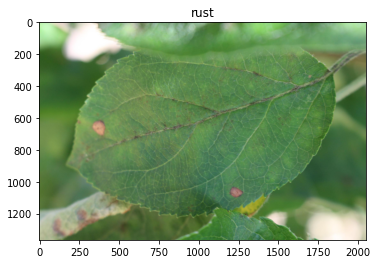

1/1 [==============================] - 0s 35ms/step
2


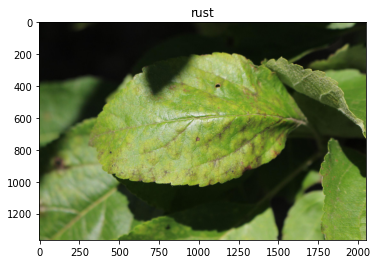

1/1 [==============================] - 0s 31ms/step
2


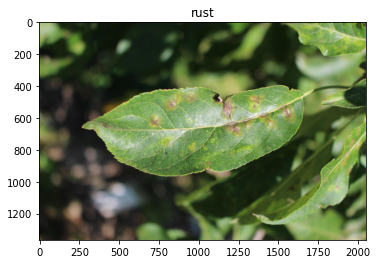

1/1 [==============================] - 0s 23ms/step
2


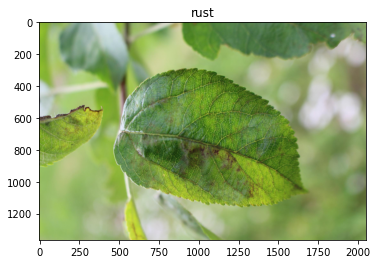

1/1 [==============================] - 0s 25ms/step
2


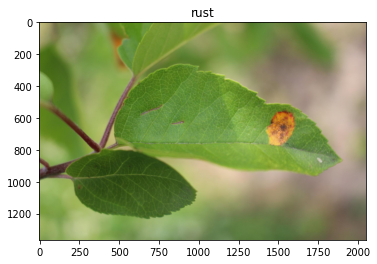

1/1 [==============================] - 0s 32ms/step
2


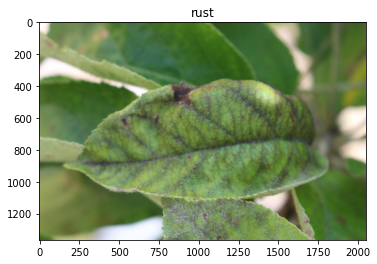

1/1 [==============================] - 0s 30ms/step
2


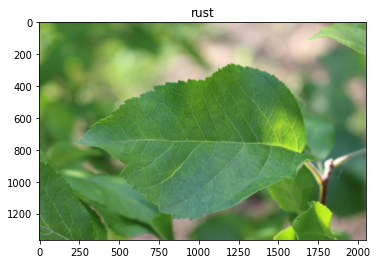

1/1 [==============================] - 0s 29ms/step
2


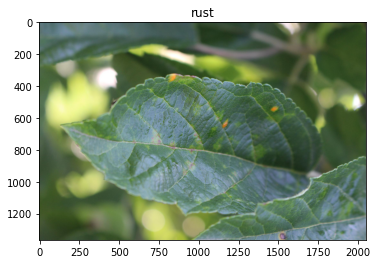

1/1 [==============================] - 0s 33ms/step
2


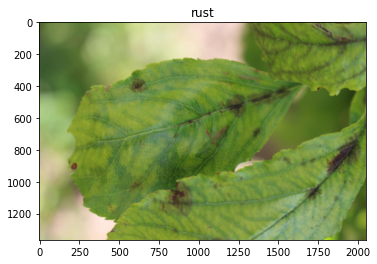

1/1 [==============================] - 0s 28ms/step
2


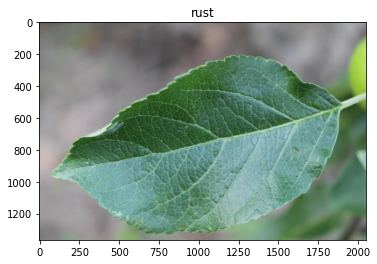

1/1 [==============================] - 0s 32ms/step
2


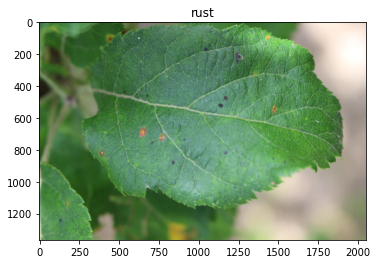

1/1 [==============================] - 0s 35ms/step
2


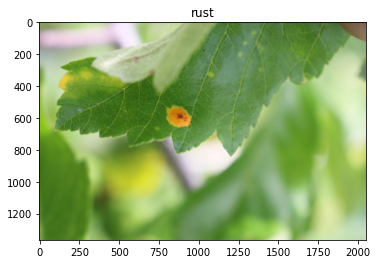

1/1 [==============================] - 0s 37ms/step
2


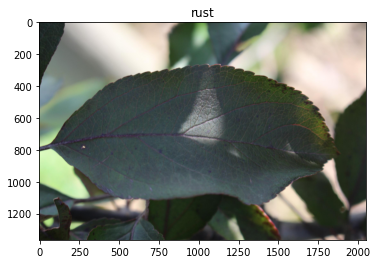

1/1 [==============================] - 0s 32ms/step
2


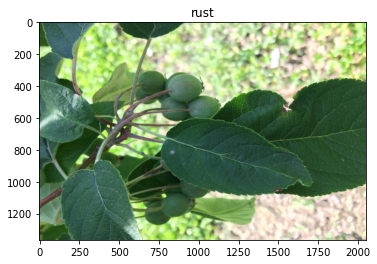

1/1 [==============================] - 0s 36ms/step
2


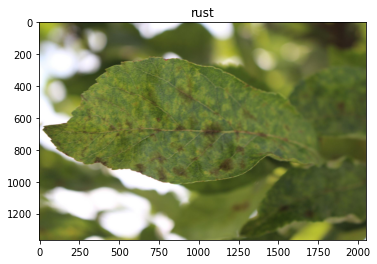

1/1 [==============================] - 0s 37ms/step
2


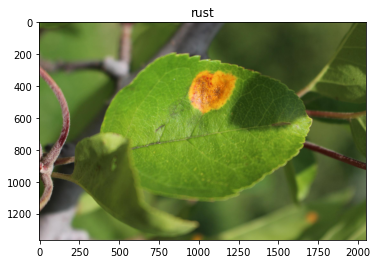

1/1 [==============================] - 0s 42ms/step
2


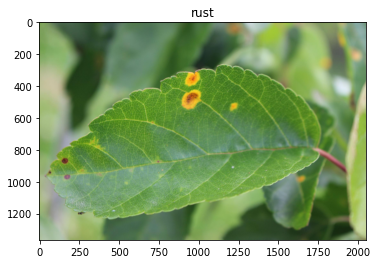

1/1 [==============================] - 0s 50ms/step
2


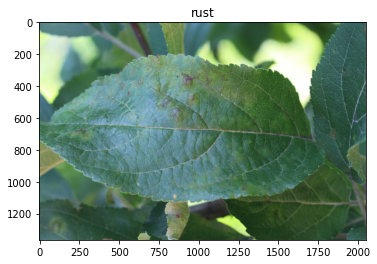

1/1 [==============================] - 0s 42ms/step
2


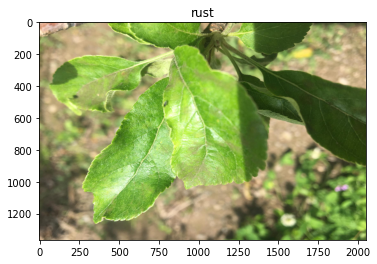

1/1 [==============================] - 0s 44ms/step
2


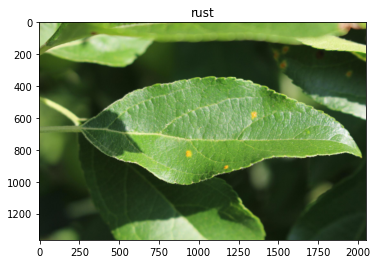

1/1 [==============================] - 0s 32ms/step
2


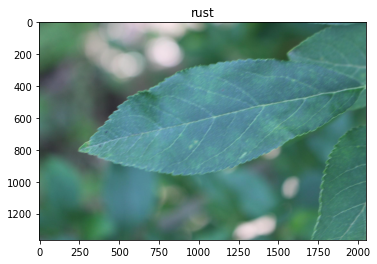

1/1 [==============================] - 0s 32ms/step
2


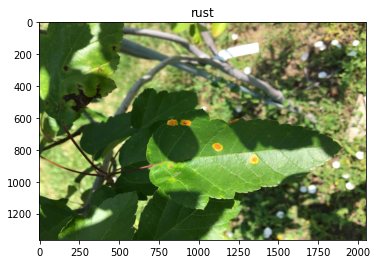

1/1 [==============================] - 0s 32ms/step
2


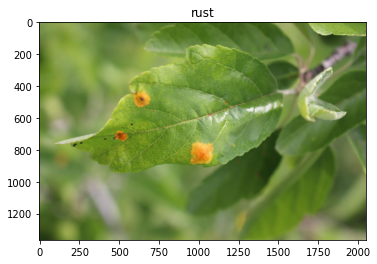

1/1 [==============================] - 0s 30ms/step
2


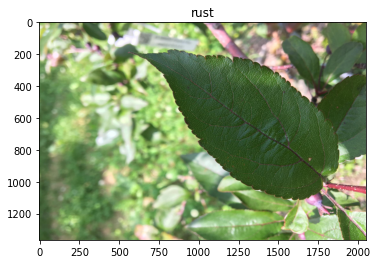

1/1 [==============================] - 0s 36ms/step
2


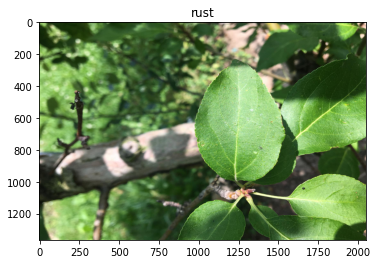

1/1 [==============================] - 0s 30ms/step
2


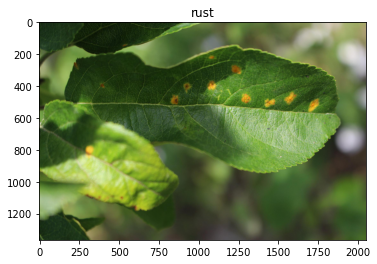

1/1 [==============================] - 0s 30ms/step
2


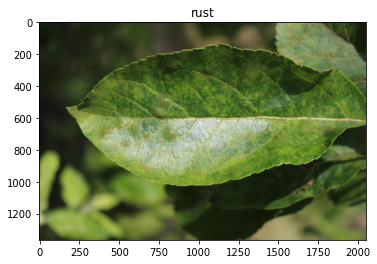

1/1 [==============================] - 0s 28ms/step
2


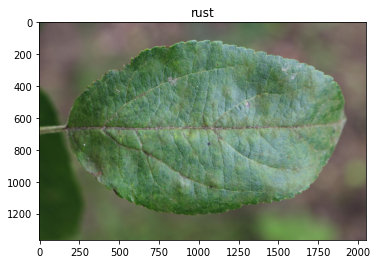

1/1 [==============================] - 0s 31ms/step
2


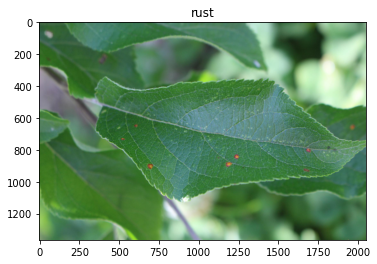

1/1 [==============================] - 0s 34ms/step
2


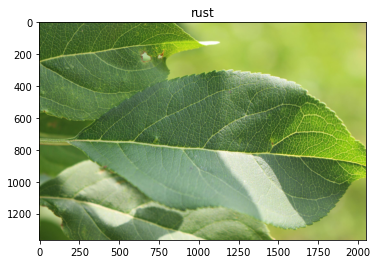

1/1 [==============================] - 0s 30ms/step
2


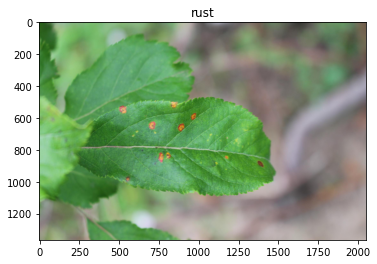

1/1 [==============================] - 0s 32ms/step
2


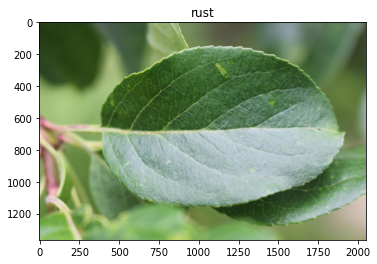

1/1 [==============================] - 0s 48ms/step
2


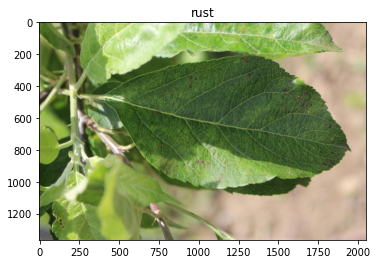

1/1 [==============================] - 0s 34ms/step
2


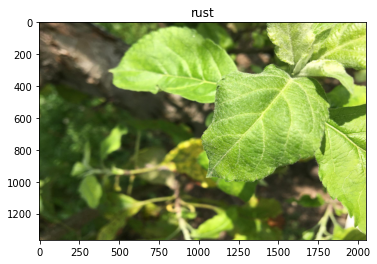

1/1 [==============================] - 0s 33ms/step
2


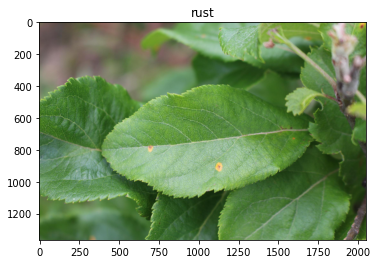

1/1 [==============================] - 0s 36ms/step
2


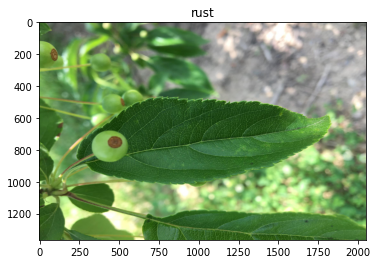

1/1 [==============================] - 0s 32ms/step
2


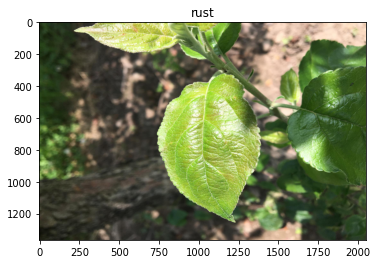

1/1 [==============================] - 0s 29ms/step
2


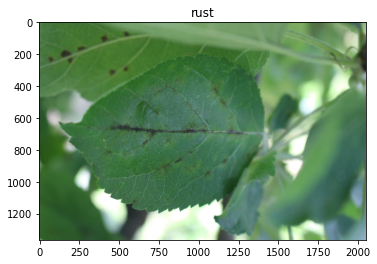

1/1 [==============================] - 0s 22ms/step
2


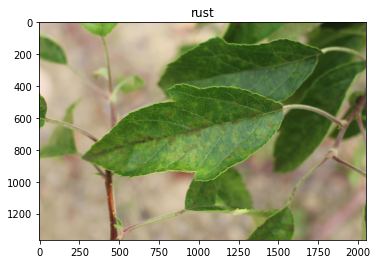

1/1 [==============================] - 0s 30ms/step
2


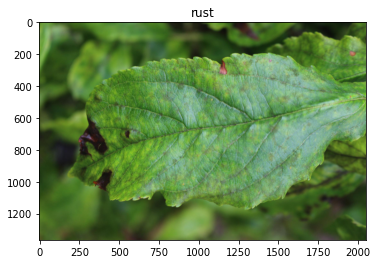

1/1 [==============================] - 0s 30ms/step
2


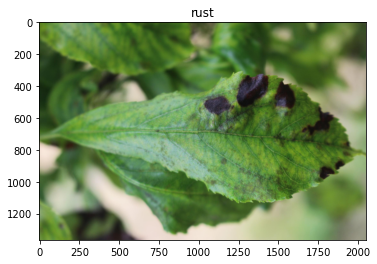

1/1 [==============================] - 0s 31ms/step
2


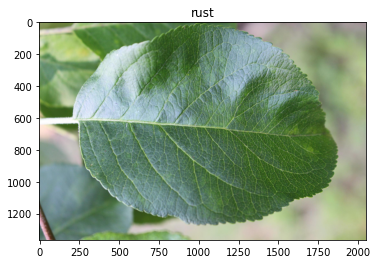

1/1 [==============================] - 0s 33ms/step
2


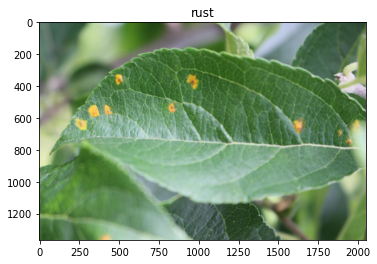

1/1 [==============================] - 0s 34ms/step
2


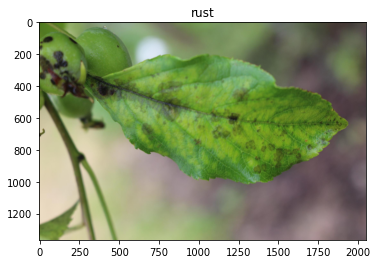

1/1 [==============================] - 0s 35ms/step
2


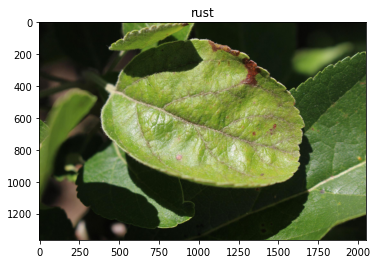

1/1 [==============================] - 0s 30ms/step
2


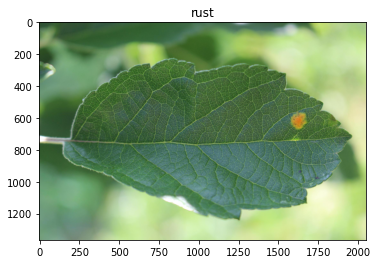

1/1 [==============================] - 0s 32ms/step
2


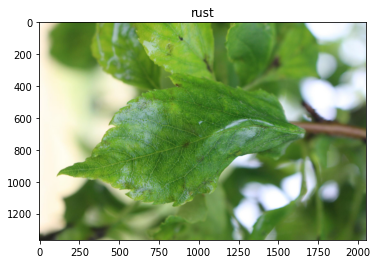

1/1 [==============================] - 0s 32ms/step
2


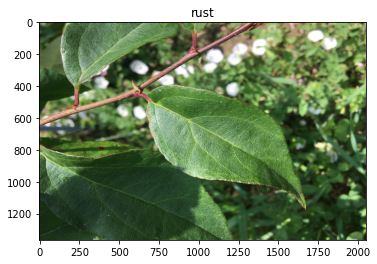

1/1 [==============================] - 0s 38ms/step
2


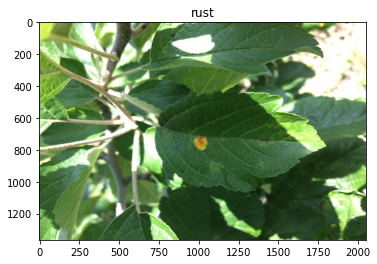

1/1 [==============================] - 0s 36ms/step
2


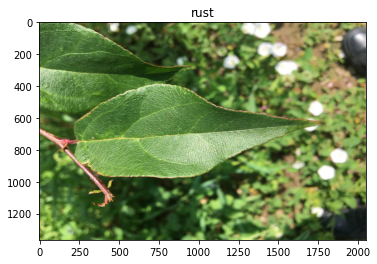

1/1 [==============================] - 0s 37ms/step
2


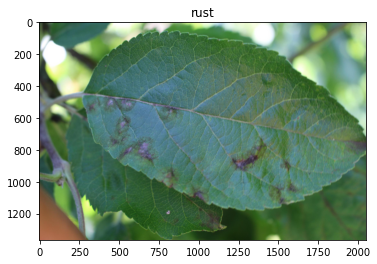

1/1 [==============================] - 0s 35ms/step
2


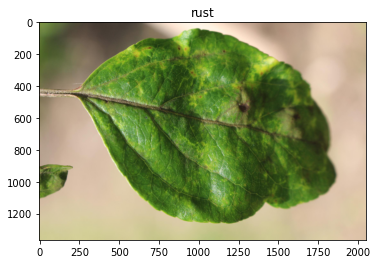

1/1 [==============================] - 0s 35ms/step
2


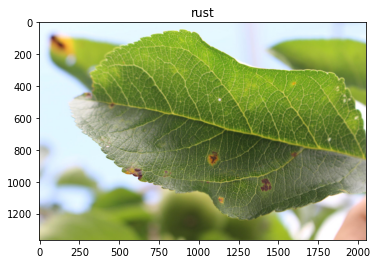

1/1 [==============================] - 0s 48ms/step
2


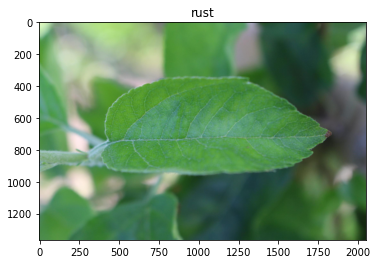

1/1 [==============================] - 0s 41ms/step
2


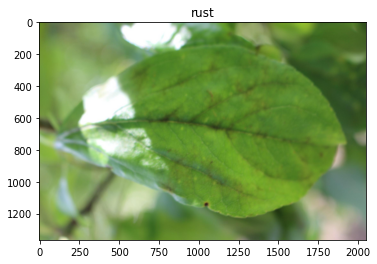

In [34]:
##predict##
import matplotlib.pyplot as plt
import os
from os import listdir
test_image=r'/content/drive/MyDrive/imagesafter1007'
j=0
X_test=[]
Y_test=[]
for i in os.listdir(test_image):       
   image_result=Image.open(os.path.join(test_image,i))
   imag=image.load_img(os.path.join(test_image,i),target_size=(128,128))
   imag=image.img_to_array(imag)
   imag=imag/255
   X_test.append(imag)
   imag=np.expand_dims(imag,axis=0)
   result=ann.predict(imag)
   print(np.argmax(result))
   Categories=['healthy','multiple_disease','rust','scab']
   image_result=plt.imshow(image_result)
   Y_test.append(np.argmax(result))
   plt.title(Categories[np.argmax(result)])
   plt.show()
   j+=1
   if(j==100):
     break

In [35]:
X_test=np.array(X_test)
X_test=X_test/255
label=label_of_test[:len(Y_test)]  
j=0
for i in range(len(Y_test)):
  if label[i]==Y_test[i]:
      j+=1
j=j/(len(Y_test))*100   
print (f"accuracy of testing is ==> {j}%")      
Y_test=np.array(Y_test)
label_of_test=np.array(label_of_test)




accuracy of testing is ==> 31.0%


In [37]:
Y_test = to_categorical(Y_test, 4)
label=np.array(label)
label = to_categorical(label, 4)
history2=ann.fit(X_test,label,epochs=10)

Epoch 1/10
4/4 [==============================] - 0s 110ms/step - loss: 21.5613 - accuracy: 0.3100
Epoch 2/10
4/4 [==============================] - 0s 105ms/step - loss: 6.1957 - accuracy: 0.3100
Epoch 3/10
4/4 [==============================] - 0s 109ms/step - loss: 1.4554 - accuracy: 0.3600
Epoch 4/10
4/4 [==============================] - 0s 67ms/step - loss: 1.3129 - accuracy: 0.3600
Epoch 5/10
4/4 [==============================] - 0s 56ms/step - loss: 1.3194 - accuracy: 0.3600
Epoch 6/10
4/4 [==============================] - 0s 55ms/step - loss: 1.3126 - accuracy: 0.3600
Epoch 7/10
4/4 [==============================] - 0s 64ms/step - loss: 1.2966 - accuracy: 0.3600
Epoch 8/10
4/4 [==============================] - 0s 59ms/step - loss: 1.2792 - accuracy: 0.3600
Epoch 9/10
4/4 [==============================] - 0s 62ms/step - loss: 1.2754 - accuracy: 0.3600
Epoch 10/10
4/4 [==============================] - 0s 54ms/step - loss: 1.2690 - accuracy: 0.3600


dict_keys(['loss', 'accuracy'])


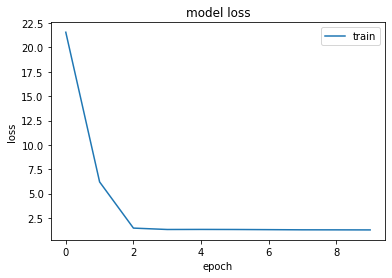

In [38]:
###########curve loss of testing#########
import matplotlib.pyplot as plt
print(history2.history.keys())
plt.plot(history2.history['loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','validation'],loc='upper right')
plt.show()

dict_keys(['loss', 'accuracy'])


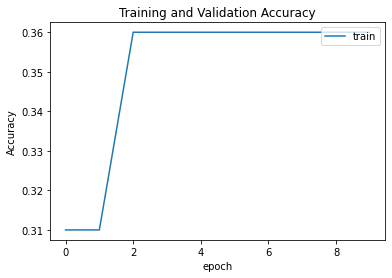

In [40]:
###########curve accuracy of testing ###############
print(history2.history.keys())
plt.plot(history2.history['accuracy'])
plt.title('Training and Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('epoch')
plt.legend(['train','validation'],loc='upper right')
plt.show()